MOVIE RECOMMENDATIONS USING PLOTS

In [638]:
import pandas as pd

In [639]:
import numpy as np

In [640]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [641]:
df = pd.read_csv('/content/drive/MyDrive/finalAIProject/movies_initial.csv', na_values = ["NaN", "nan"])

In [642]:
df

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,...,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type
0,1,Carmencita,1894,NOT RATED,1 min,"Documentary, Short",NaN,William K.L. Dickson,NaN,Carmencita,...,5.9,1032.0,https://m.media-amazon.com/images/M/MV5BMjAzND...,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,NaN,USA,NaN,2015-08-26 00:03:45.040000000,movie
1,5,Blacksmith Scene,1893,UNRATED,1 min,Short,1893-05-09,William K.L. Dickson,NaN,"Charles Kayser, John Ott",...,6.2,1189.0,NaN,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,NaN,USA,1 win.,2015-08-26 00:03:50.133000000,movie
2,3,Pauvre Pierrot,1892,NaN,4 min,"Animation, Comedy, Short",1892-10-28,�mile Reynaud,NaN,NaN,...,6.7,566.0,NaN,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",NaN,France,NaN,2015-08-12 00:06:02.720000000,movie
3,8,Edison Kinetoscopic Record of a Sneeze,1894,NaN,1 min,"Documentary, Short",1894-01-09,William K.L. Dickson,NaN,Fred Ott,...,5.9,988.0,NaN,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,NaN,USA,NaN,2015-08-10 00:21:07.127000000,movie
4,10,Employees Leaving the Lumi�re Factory,1895,NaN,1 min,"Documentary, Short",1895-03-22,Louis Lumi�re,NaN,NaN,...,6.9,3469.0,NaN,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,NaN,France,NaN,2015-08-26 00:03:56.603000000,movie
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46009,5005684,The New Classmate,2015,NaN,NaN,"Drama, Family",2015-10-11,Ashwiny Iyer Tiwari,NaN,"Swara Bhaskar, Ratna Pathak, Pankaj Tripathy",...,NaN,NaN,NaN,NaN,NaN,Hindi,India,NaN,2015-09-10 22:28:58.883000000,movie
46010,5013056,Untitled Christopher Nolan Project,2017,NaN,NaN,Sci-Fi,2017-07-21,Christopher Nolan,"Christopher Nolan (screenplay), Christopher Nolan",NaN,...,NaN,NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,English,"USA, UK",NaN,2015-09-11 17:15:04.527000000,movie
46011,5013980,Die Turnschuh-Giganten,2016,NaN,NaN,"Biography, Drama, War",NaN,Oliver Dommenget,Christian Schnalke,"Ken Duken, Florian Bartholom�i, Torben Liebrec...",...,NaN,NaN,NaN,NaN,NaN,German,Germany,NaN,2015-09-12 23:13:48.997000000,movie
46012,5016760,The Monster of Mangatiti,2015,NaN,NaN,NaN,2015-09-06,NaN,John Banas,"Greta Gregory, Mark Mitchinson, Flynn Allan, H...",...,NaN,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,English,New Zealand,NaN,2015-09-12 03:47:27.780000000,movie


In [643]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46014 entries, 0 to 46013
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   imdbID       46014 non-null  int64  
 1   title        46014 non-null  object 
 2   year         46014 non-null  object 
 3   rating       24629 non-null  object 
 4   runtime      43377 non-null  object 
 5   genre        45615 non-null  object 
 6   released     43002 non-null  object 
 7   director     45409 non-null  object 
 8   writer       42942 non-null  object 
 9   cast         44928 non-null  object 
 10  metacritic   9401 non-null   float64
 11  imdbRating   44300 non-null  float64
 12  imdbVotes    44299 non-null  float64
 13  poster       35798 non-null  object 
 14  plot         42161 non-null  object 
 15  fullplot     41421 non-null  object 
 16  language     44899 non-null  object 
 17  country      45830 non-null  object 
 18  awards       23542 non-null  object 
 19  last

In [644]:
for i in df.columns:
  if df[i].isnull().sum() > 0.3 * len(df):
    df.drop(i, axis = 1, inplace = True)

In [645]:
df

,imdbID,title,year,runtime,genre,released,director,writer,cast,imdbRating,imdbVotes,poster,plot,fullplot,language,country,lastupdated,type
0,1,Carmencita,1894,1 min,"Documentary, Short",NaN,William K.L. Dickson,NaN,Carmencita,5.9,1032.0,https://m.media-amazon.com/images/M/MV5BMjAzND...,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,NaN,USA,2015-08-26 00:03:45.040000000,movie
1,5,Blacksmith Scene,1893,1 min,Short,1893-05-09,William K.L. Dickson,NaN,"Charles Kayser, John Ott",6.2,1189.0,NaN,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,NaN,USA,2015-08-26 00:03:50.133000000,movie
2,3,Pauvre Pierrot,1892,4 min,"Animation, Comedy, Short",1892-10-28,�mile Reynaud,NaN,NaN,6.7,566.0,NaN,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",NaN,France,2015-08-12 00:06:02.720000000,movie
3,8,Edison Kinetoscopic Record of a Sneeze,1894,1 min,"Documentary, Short",1894-01-09,William K.L. Dickson,NaN,Fred Ott,5.9,988.0,NaN,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,NaN,USA,2015-08-10 00:21:07.127000000,movie
4,10,Employees Leaving the Lumi�re Factory,1895,1 min,"Documentary, Short",1895-03-22,Louis Lumi�re,NaN,NaN,6.9,3469.0,NaN,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,NaN,France,2015-08-26 00:03:56.603000000,movie
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46009,5005684,The New Classmate,2015,NaN,"Drama, Family",2015-10-11,Ashwiny Iyer Tiwari,NaN,"Swara Bhaskar, Ratna Pathak, Pankaj Tripathy",NaN,NaN,NaN,NaN,NaN,Hindi,India,2015-09-10 22:28:58.883000000,movie
46010,5013056,Untitled Christopher Nolan Project,2017,NaN,Sci-Fi,2017-07-21,Christopher Nolan,"Christopher Nolan (screenplay), Christopher Nolan",NaN,NaN,NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,English,"USA, UK",2015-09-11 17:15:04.527000000,movie
46011,5013980,Die Turnschuh-Giganten,2016,NaN,"Biography, Drama, War",NaN,Oliver Dommenget,Christian Schnalke,"Ken Duken, Florian Bartholom�i, Torben Liebrec...",NaN,NaN,NaN,NaN,NaN,German,Germany,2015-09-12 23:13:48.997000000,movie
46012,5016760,The Monster of Mangatiti,2015,NaN,NaN,2015-09-06,NaN,John Banas,"Greta Gregory, Mark Mitchinson, Flynn Allan, H...",NaN,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,English,New Zealand,2015-09-12 03:47:27.780000000,movie


In [646]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46014 entries, 0 to 46013
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   imdbID       46014 non-null  int64  
 1   title        46014 non-null  object 
 2   year         46014 non-null  object 
 3   runtime      43377 non-null  object 
 4   genre        45615 non-null  object 
 5   released     43002 non-null  object 
 6   director     45409 non-null  object 
 7   writer       42942 non-null  object 
 8   cast         44928 non-null  object 
 9   imdbRating   44300 non-null  float64
 10  imdbVotes    44299 non-null  float64
 11  poster       35798 non-null  object 
 12  plot         42161 non-null  object 
 13  fullplot     41421 non-null  object 
 14  language     44899 non-null  object 
 15  country      45830 non-null  object 
 16  lastupdated  46014 non-null  object 
 17  type         45976 non-null  object 
dtypes: float64(2), int64(1), object(15)
memory usa

In [647]:
df['type'].unique()

array(['movie', 'series', nan], dtype=object)

In [648]:
columns_to_drop = ['director', 'runtime', 'lastupdated', 'poster', 'cast', 'language', 'writer', 'runtime']

In [649]:
df.drop(columns = columns_to_drop, inplace = True, axis = 1)

In [650]:
df

,imdbID,title,year,genre,released,imdbRating,imdbVotes,plot,fullplot,country,type
0,1,Carmencita,1894,"Documentary, Short",NaN,5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,USA,movie
1,5,Blacksmith Scene,1893,Short,1893-05-09,6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,USA,movie
2,3,Pauvre Pierrot,1892,"Animation, Comedy, Short",1892-10-28,6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",France,movie
3,8,Edison Kinetoscopic Record of a Sneeze,1894,"Documentary, Short",1894-01-09,5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,USA,movie
4,10,Employees Leaving the Lumi�re Factory,1895,"Documentary, Short",1895-03-22,6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,France,movie
...,...,...,...,...,...,...,...,...,...,...,...
46009,5005684,The New Classmate,2015,"Drama, Family",2015-10-11,NaN,NaN,NaN,NaN,India,movie
46010,5013056,Untitled Christopher Nolan Project,2017,Sci-Fi,2017-07-21,NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,"USA, UK",movie
46011,5013980,Die Turnschuh-Giganten,2016,"Biography, Drama, War",NaN,NaN,NaN,NaN,NaN,Germany,movie
46012,5016760,The Monster of Mangatiti,2015,NaN,2015-09-06,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,New Zealand,movie


In [651]:
df.drop(columns= "released", inplace = True, axis = 1)

In [652]:
df

,imdbID,title,year,genre,imdbRating,imdbVotes,plot,fullplot,country,type
0,1,Carmencita,1894,"Documentary, Short",5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,USA,movie
1,5,Blacksmith Scene,1893,Short,6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,USA,movie
2,3,Pauvre Pierrot,1892,"Animation, Comedy, Short",6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",France,movie
3,8,Edison Kinetoscopic Record of a Sneeze,1894,"Documentary, Short",5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,USA,movie
4,10,Employees Leaving the Lumi�re Factory,1895,"Documentary, Short",6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,France,movie
...,...,...,...,...,...,...,...,...,...,...
46009,5005684,The New Classmate,2015,"Drama, Family",NaN,NaN,NaN,NaN,India,movie
46010,5013056,Untitled Christopher Nolan Project,2017,Sci-Fi,NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,"USA, UK",movie
46011,5013980,Die Turnschuh-Giganten,2016,"Biography, Drama, War",NaN,NaN,NaN,NaN,Germany,movie
46012,5016760,The Monster of Mangatiti,2015,NaN,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,New Zealand,movie


In [653]:
def split_genres(genres):
    if type(genres) == str:
      return genres.split(", ")
    else:
      return None


In [654]:
df['genre'] = df['genre'].apply(split_genres)

In [655]:
df

,imdbID,title,year,genre,imdbRating,imdbVotes,plot,fullplot,country,type
0,1,Carmencita,1894,"[Documentary, Short]",5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,USA,movie
1,5,Blacksmith Scene,1893,[Short],6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,USA,movie
2,3,Pauvre Pierrot,1892,"[Animation, Comedy, Short]",6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",France,movie
3,8,Edison Kinetoscopic Record of a Sneeze,1894,"[Documentary, Short]",5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,USA,movie
4,10,Employees Leaving the Lumi�re Factory,1895,"[Documentary, Short]",6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,France,movie
...,...,...,...,...,...,...,...,...,...,...
46009,5005684,The New Classmate,2015,"[Drama, Family]",NaN,NaN,NaN,NaN,India,movie
46010,5013056,Untitled Christopher Nolan Project,2017,[Sci-Fi],NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,"USA, UK",movie
46011,5013980,Die Turnschuh-Giganten,2016,"[Biography, Drama, War]",NaN,NaN,NaN,NaN,Germany,movie
46012,5016760,The Monster of Mangatiti,2015,None,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,New Zealand,movie


In [656]:
all_genres = []
for genre in pd.Series(pd.read_csv('/content/drive/MyDrive/finalAIProject/movies_initial.csv')['genre'].unique()):
  if type(genre) == str:
    for i in genre.split(", "):
      if i not in all_genres:
        all_genres.append(i)
  else:
    continue


In [657]:
all_genres

['Documentary',
 'Short',
 'Animation',
 'Comedy',
 'Horror',
 'Biography',
 'Fantasy',
 'Drama',
 'Adventure',
 'Action',
 'Western',
 'Music',
 'Family',
 'Crime',
 'War',
 'Romance',
 'History',
 'Sci-Fi',
 'Mystery',
 'Sport',
 'Thriller',
 'Musical',
 'Film-Noir',
 'Adult',
 'Talk-Show',
 'News',
 'Reality-TV']

In [658]:
df[all_genres] = 0

In [659]:
df.columns

Index(['imdbID', 'title', 'year', 'genre', 'imdbRating', 'imdbVotes', 'plot',
       'fullplot', 'country', 'type', 'Documentary', 'Short', 'Animation',
       'Comedy', 'Horror', 'Biography', 'Fantasy', 'Drama', 'Adventure',
       'Action', 'Western', 'Music', 'Family', 'Crime', 'War', 'Romance',
       'History', 'Sci-Fi', 'Mystery', 'Sport', 'Thriller', 'Musical',
       'Film-Noir', 'Adult', 'Talk-Show', 'News', 'Reality-TV'],
      dtype='object')

In [660]:
df

,imdbID,title,year,genre,imdbRating,imdbVotes,plot,fullplot,country,type,...,Sci-Fi,Mystery,Sport,Thriller,Musical,Film-Noir,Adult,Talk-Show,News,Reality-TV
0,1,Carmencita,1894,"[Documentary, Short]",5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,USA,movie,...,0,0,0,0,0,0,0,0,0,0
1,5,Blacksmith Scene,1893,[Short],6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,USA,movie,...,0,0,0,0,0,0,0,0,0,0
2,3,Pauvre Pierrot,1892,"[Animation, Comedy, Short]",6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",France,movie,...,0,0,0,0,0,0,0,0,0,0
3,8,Edison Kinetoscopic Record of a Sneeze,1894,"[Documentary, Short]",5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,USA,movie,...,0,0,0,0,0,0,0,0,0,0
4,10,Employees Leaving the Lumi�re Factory,1895,"[Documentary, Short]",6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,France,movie,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46009,5005684,The New Classmate,2015,"[Drama, Family]",NaN,NaN,NaN,NaN,India,movie,...,0,0,0,0,0,0,0,0,0,0
46010,5013056,Untitled Christopher Nolan Project,2017,[Sci-Fi],NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,"USA, UK",movie,...,0,0,0,0,0,0,0,0,0,0
46011,5013980,Die Turnschuh-Giganten,2016,"[Biography, Drama, War]",NaN,NaN,NaN,NaN,Germany,movie,...,0,0,0,0,0,0,0,0,0,0
46012,5016760,The Monster of Mangatiti,2015,None,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,New Zealand,movie,...,0,0,0,0,0,0,0,0,0,0


In [661]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46014 entries, 0 to 46013
Data columns (total 37 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   imdbID       46014 non-null  int64  
 1   title        46014 non-null  object 
 2   year         46014 non-null  object 
 3   genre        45615 non-null  object 
 4   imdbRating   44300 non-null  float64
 5   imdbVotes    44299 non-null  float64
 6   plot         42161 non-null  object 
 7   fullplot     41421 non-null  object 
 8   country      45830 non-null  object 
 9   type         45976 non-null  object 
 10  Documentary  46014 non-null  int64  
 11  Short        46014 non-null  int64  
 12  Animation    46014 non-null  int64  
 13  Comedy       46014 non-null  int64  
 14  Horror       46014 non-null  int64  
 15  Biography    46014 non-null  int64  
 16  Fantasy      46014 non-null  int64  
 17  Drama        46014 non-null  int64  
 18  Adventure    46014 non-null  int64  
 19  Acti

In [662]:

df.drop("country", axis = 1, inplace = True)

In [663]:
df

,imdbID,title,year,genre,imdbRating,imdbVotes,plot,fullplot,type,Documentary,...,Sci-Fi,Mystery,Sport,Thriller,Musical,Film-Noir,Adult,Talk-Show,News,Reality-TV
0,1,Carmencita,1894,"[Documentary, Short]",5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,movie,0,...,0,0,0,0,0,0,0,0,0,0
1,5,Blacksmith Scene,1893,[Short],6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,movie,0,...,0,0,0,0,0,0,0,0,0,0
2,3,Pauvre Pierrot,1892,"[Animation, Comedy, Short]",6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",movie,0,...,0,0,0,0,0,0,0,0,0,0
3,8,Edison Kinetoscopic Record of a Sneeze,1894,"[Documentary, Short]",5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,movie,0,...,0,0,0,0,0,0,0,0,0,0
4,10,Employees Leaving the Lumi�re Factory,1895,"[Documentary, Short]",6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,movie,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46009,5005684,The New Classmate,2015,"[Drama, Family]",NaN,NaN,NaN,NaN,movie,0,...,0,0,0,0,0,0,0,0,0,0
46010,5013056,Untitled Christopher Nolan Project,2017,[Sci-Fi],NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,movie,0,...,0,0,0,0,0,0,0,0,0,0
46011,5013980,Die Turnschuh-Giganten,2016,"[Biography, Drama, War]",NaN,NaN,NaN,NaN,movie,0,...,0,0,0,0,0,0,0,0,0,0
46012,5016760,The Monster of Mangatiti,2015,None,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,movie,0,...,0,0,0,0,0,0,0,0,0,0


In [664]:
df.reset_index()

,index,imdbID,title,year,genre,imdbRating,imdbVotes,plot,fullplot,type,...,Sci-Fi,Mystery,Sport,Thriller,Musical,Film-Noir,Adult,Talk-Show,News,Reality-TV
0,0,1,Carmencita,1894,"[Documentary, Short]",5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,movie,...,0,0,0,0,0,0,0,0,0,0
1,1,5,Blacksmith Scene,1893,[Short],6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,movie,...,0,0,0,0,0,0,0,0,0,0
2,2,3,Pauvre Pierrot,1892,"[Animation, Comedy, Short]",6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",movie,...,0,0,0,0,0,0,0,0,0,0
3,3,8,Edison Kinetoscopic Record of a Sneeze,1894,"[Documentary, Short]",5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,movie,...,0,0,0,0,0,0,0,0,0,0
4,4,10,Employees Leaving the Lumi�re Factory,1895,"[Documentary, Short]",6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,movie,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46009,46009,5005684,The New Classmate,2015,"[Drama, Family]",NaN,NaN,NaN,NaN,movie,...,0,0,0,0,0,0,0,0,0,0
46010,46010,5013056,Untitled Christopher Nolan Project,2017,[Sci-Fi],NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,movie,...,0,0,0,0,0,0,0,0,0,0
46011,46011,5013980,Die Turnschuh-Giganten,2016,"[Biography, Drama, War]",NaN,NaN,NaN,NaN,movie,...,0,0,0,0,0,0,0,0,0,0
46012,46012,5016760,The Monster of Mangatiti,2015,None,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,movie,...,0,0,0,0,0,0,0,0,0,0


In [665]:
df

,imdbID,title,year,genre,imdbRating,imdbVotes,plot,fullplot,type,Documentary,...,Sci-Fi,Mystery,Sport,Thriller,Musical,Film-Noir,Adult,Talk-Show,News,Reality-TV
0,1,Carmencita,1894,"[Documentary, Short]",5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,movie,0,...,0,0,0,0,0,0,0,0,0,0
1,5,Blacksmith Scene,1893,[Short],6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,movie,0,...,0,0,0,0,0,0,0,0,0,0
2,3,Pauvre Pierrot,1892,"[Animation, Comedy, Short]",6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",movie,0,...,0,0,0,0,0,0,0,0,0,0
3,8,Edison Kinetoscopic Record of a Sneeze,1894,"[Documentary, Short]",5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,movie,0,...,0,0,0,0,0,0,0,0,0,0
4,10,Employees Leaving the Lumi�re Factory,1895,"[Documentary, Short]",6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,movie,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46009,5005684,The New Classmate,2015,"[Drama, Family]",NaN,NaN,NaN,NaN,movie,0,...,0,0,0,0,0,0,0,0,0,0
46010,5013056,Untitled Christopher Nolan Project,2017,[Sci-Fi],NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,movie,0,...,0,0,0,0,0,0,0,0,0,0
46011,5013980,Die Turnschuh-Giganten,2016,"[Biography, Drama, War]",NaN,NaN,NaN,NaN,movie,0,...,0,0,0,0,0,0,0,0,0,0
46012,5016760,The Monster of Mangatiti,2015,None,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,movie,0,...,0,0,0,0,0,0,0,0,0,0


In [666]:
for i in range(len(df)):
  if df.iloc[i, 3] is not None:
    for j in df.iloc[i, 3]:
      df.loc[i, j] = 1
  else:
    continue

In [667]:
df

,imdbID,title,year,genre,imdbRating,imdbVotes,plot,fullplot,type,Documentary,...,Sci-Fi,Mystery,Sport,Thriller,Musical,Film-Noir,Adult,Talk-Show,News,Reality-TV
0,1,Carmencita,1894,"[Documentary, Short]",5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,movie,1,...,0,0,0,0,0,0,0,0,0,0
1,5,Blacksmith Scene,1893,[Short],6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,movie,0,...,0,0,0,0,0,0,0,0,0,0
2,3,Pauvre Pierrot,1892,"[Animation, Comedy, Short]",6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",movie,0,...,0,0,0,0,0,0,0,0,0,0
3,8,Edison Kinetoscopic Record of a Sneeze,1894,"[Documentary, Short]",5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,movie,1,...,0,0,0,0,0,0,0,0,0,0
4,10,Employees Leaving the Lumi�re Factory,1895,"[Documentary, Short]",6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,movie,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46009,5005684,The New Classmate,2015,"[Drama, Family]",NaN,NaN,NaN,NaN,movie,0,...,0,0,0,0,0,0,0,0,0,0
46010,5013056,Untitled Christopher Nolan Project,2017,[Sci-Fi],NaN,NaN,Plot is being kept under wraps.,Plot is being kept under wraps.,movie,0,...,1,0,0,0,0,0,0,0,0,0
46011,5013980,Die Turnschuh-Giganten,2016,"[Biography, Drama, War]",NaN,NaN,NaN,NaN,movie,0,...,0,0,0,0,0,0,0,0,0,0
46012,5016760,The Monster of Mangatiti,2015,None,NaN,NaN,Heather Walsh tells her story of the time she ...,Heather Walsh tells her story of the time she ...,movie,0,...,0,0,0,0,0,0,0,0,0,0


In [668]:
df.dropna(inplace = True)

In [669]:
df

,imdbID,title,year,genre,imdbRating,imdbVotes,plot,fullplot,type,Documentary,...,Sci-Fi,Mystery,Sport,Thriller,Musical,Film-Noir,Adult,Talk-Show,News,Reality-TV
0,1,Carmencita,1894,"[Documentary, Short]",5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,movie,1,...,0,0,0,0,0,0,0,0,0,0
1,5,Blacksmith Scene,1893,[Short],6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,movie,0,...,0,0,0,0,0,0,0,0,0,0
2,3,Pauvre Pierrot,1892,"[Animation, Comedy, Short]",6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",movie,0,...,0,0,0,0,0,0,0,0,0,0
3,8,Edison Kinetoscopic Record of a Sneeze,1894,"[Documentary, Short]",5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,movie,1,...,0,0,0,0,0,0,0,0,0,0
4,10,Employees Leaving the Lumi�re Factory,1895,"[Documentary, Short]",6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,movie,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45949,4936064,In Jackson Heights,2015,[Documentary],8.6,10.0,"Jackson Heights, Queens is one of the most cul...","Jackson Heights, Queens, New York City is one ...",movie,1,...,0,0,0,0,0,0,0,0,0,0
45974,4957236,Cosmos Laundromat,2015,"[Animation, Short]",8.8,10.0,"On a desolate island, suicidal sheep Franck me...","On a desolate island, suicidal sheep Franck me...",movie,0,...,0,0,0,0,0,0,0,0,0,0
45982,4967094,Our Times,2015,[Romance],7.4,7.0,Love grows where it isn't expected in this end...,The movie takes us on a 20 year journey throug...,movie,0,...,0,0,0,0,0,0,0,0,0,0
45998,4987556,Thani Oruvan,2015,"[Action, Thriller]",9.4,25.0,Revolving around a police officer who is passi...,Thoroughly frustrated with Industrialists and ...,movie,0,...,0,0,0,1,0,0,0,0,0,0


In [670]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 40197 entries, 0 to 46008
Data columns (total 36 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   imdbID       40197 non-null  int64  
 1   title        40197 non-null  object 
 2   year         40197 non-null  object 
 3   genre        40197 non-null  object 
 4   imdbRating   40197 non-null  float64
 5   imdbVotes    40197 non-null  float64
 6   plot         40197 non-null  object 
 7   fullplot     40197 non-null  object 
 8   type         40197 non-null  object 
 9   Documentary  40197 non-null  int64  
 10  Short        40197 non-null  int64  
 11  Animation    40197 non-null  int64  
 12  Comedy       40197 non-null  int64  
 13  Horror       40197 non-null  int64  
 14  Biography    40197 non-null  int64  
 15  Fantasy      40197 non-null  int64  
 16  Drama        40197 non-null  int64  
 17  Adventure    40197 non-null  int64  
 18  Action       40197 non-null  int64  
 19  Western  

In [671]:
df = df.reset_index()

In [672]:
df

,index,imdbID,title,year,genre,imdbRating,imdbVotes,plot,fullplot,type,...,Sci-Fi,Mystery,Sport,Thriller,Musical,Film-Noir,Adult,Talk-Show,News,Reality-TV
0,0,1,Carmencita,1894,"[Documentary, Short]",5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,movie,...,0,0,0,0,0,0,0,0,0,0
1,1,5,Blacksmith Scene,1893,[Short],6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,movie,...,0,0,0,0,0,0,0,0,0,0
2,2,3,Pauvre Pierrot,1892,"[Animation, Comedy, Short]",6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",movie,...,0,0,0,0,0,0,0,0,0,0
3,3,8,Edison Kinetoscopic Record of a Sneeze,1894,"[Documentary, Short]",5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,movie,...,0,0,0,0,0,0,0,0,0,0
4,4,10,Employees Leaving the Lumi�re Factory,1895,"[Documentary, Short]",6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,movie,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40192,45949,4936064,In Jackson Heights,2015,[Documentary],8.6,10.0,"Jackson Heights, Queens is one of the most cul...","Jackson Heights, Queens, New York City is one ...",movie,...,0,0,0,0,0,0,0,0,0,0
40193,45974,4957236,Cosmos Laundromat,2015,"[Animation, Short]",8.8,10.0,"On a desolate island, suicidal sheep Franck me...","On a desolate island, suicidal sheep Franck me...",movie,...,0,0,0,0,0,0,0,0,0,0
40194,45982,4967094,Our Times,2015,[Romance],7.4,7.0,Love grows where it isn't expected in this end...,The movie takes us on a 20 year journey throug...,movie,...,0,0,0,0,0,0,0,0,0,0
40195,45998,4987556,Thani Oruvan,2015,"[Action, Thriller]",9.4,25.0,Revolving around a police officer who is passi...,Thoroughly frustrated with Industrialists and ...,movie,...,0,0,0,1,0,0,0,0,0,0


Preprocessing the text from the dataframe

In [673]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [674]:
vectorizer = TfidfVectorizer(stop_words = 'english')

In [675]:
df["plot"]

,plot
0,"Performing on what looks like a small wooden stage, wearing a dress with a hoop skirt and white high-heeled pumps, Carmencita does a dance with kicks and twirls, a smile always on her face."
1,Three men hammer on an anvil and pass a bottle of beer around.
2,"One night, Arlequin come to see his lover Colombine. But then Pierrot knocks at the door and Colombine and Arlequin hide. Pierrot starts singing but Arlequin scares him and the poor man goes away."
3,A man (Thomas Edison's assistant) takes a pinch of snuff and sneezes. This is one of the earliest Thomas Edison films and was the first motion picture to be copyrighted in the United States.
4,"A man opens the big gates to the Lumi�re factory. Through the gateway and a smaller doorway beside it, workers are streaming out, turning either left or right. Most of them are women in ..."
5,"A group of people are standing in a straight line along the platform of a railway station, waiting for a train, which is seen coming at some distance. When the train stops at the platform, ..."
6,"A gardener is watering his flowers, when a mischievous boy sneaks up behind his back, and puts a foot on the water hose. The gardener is surprised, and looks into the nozzle to find out why..."
7,"A baby is seated at a table between its cheerful parents, Auguste and Marguerite Lumi�re. While the father is feeding the baby with a spoon, the mother is pouring coffee into her cup. The ..."
8,"Several little boys run along a pier, then jump into the ocean."
9,"Auguste Lumi�re directs four workers in the demolition of an old wall at the Lumi�re factory. One worker is pressing the wall inwards with a jackscrew, while another is pushing it with a ..."


In [676]:
def vectorize(plot):
  return vectorizer.fit_transform(plot)

In [677]:
documents = []

for pl in df["plot"]:
  documents.append(pl)

In [678]:
documents

['Performing on what looks like a small wooden stage, wearing a dress with a hoop skirt and white high-heeled pumps, Carmencita does a dance with kicks and twirls, a smile always on her face.',
 'Three men hammer on an anvil and pass a bottle of beer around.',
 'One night, Arlequin come to see his lover Colombine. But then Pierrot knocks at the door and Colombine and Arlequin hide. Pierrot starts singing but Arlequin scares him and the poor man goes away.',
 "A man (Thomas Edison's assistant) takes a pinch of snuff and sneezes. This is one of the earliest Thomas Edison films and was the first motion picture to be copyrighted in the United States.",
 'A man opens the big gates to the Lumi�re factory. Through the gateway and a smaller doorway beside it, workers are streaming out, turning either left or right. Most of them are women in ...',
 'A group of people are standing in a straight line along the platform of a railway station, waiting for a train, which is seen coming at some distan

In [679]:
X = vectorizer.fit_transform(documents)

In [680]:
X

<40197x45729 sparse matrix of type '<class 'numpy.float64'>'
	with 575891 stored elements in Compressed Sparse Row format>

In [681]:
terms = vectorizer.get_feature_names_out()

In [682]:
terms

array(['00', '000', '000km', ..., 'zyga', 'zygon', 'zylberstein'],
      dtype=object)

Elbow Method to determine optimal k

In [683]:
from sklearn.cluster import KMeans

In [684]:
import matplotlib.pyplot as plt

In [685]:
from sklearn.model_selection import train_test_split

Splitting the data into training, testing and validation data subsets

In [686]:
X, xtest = train_test_split(X, test_size = 0.4, random_state = 42)

In [687]:
xval, xtest = train_test_split(xtest, test_size = 0.5, random_state = 42)

Elbow Method:

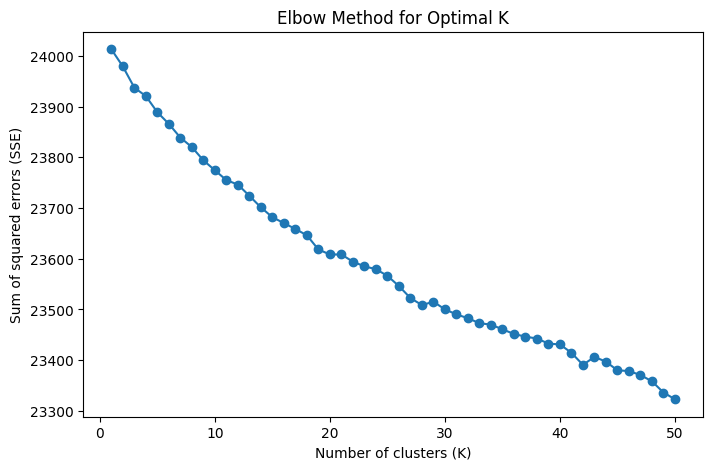

In [688]:
num_samples = 50

# Range of K values to test (1 to num_samples)
K_range = range(1, num_samples + 1)

# List to store SSE for each K
sse = []

# Compute K-means clustering for each K and calculate SSE
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, init='k-means++', max_iter=100, n_init=1)
    kmeans.fit(X)
    sse.append(kmeans.inertia_)  # inertia_ is the SSE

# Plot SSE vs. K
plt.figure(figsize=(8, 5))
plt.plot(K_range, sse, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Sum of squared errors (SSE)')
plt.title('Elbow Method for Optimal K')
plt.show()

Using the knee locator to identift the optimal number of clusters

In [689]:
pip install kneed

In [690]:
from kneed import KneeLocator

kneedle = KneeLocator(K_range, sse, S=1.0, curve="convex", direction="decreasing")

print(f'The optimal number of clusters is: {kneedle.knee}')

The optimal number of clusters is: 19


In [691]:
optimal_clusters = kneedle.knee

Building the model

In [692]:
model = KMeans(n_clusters = optimal_clusters, random_state = 42, init='k-means++', max_iter=100, n_init=1)

In [693]:
model

KMeans(max_iter=100, n_clusters=19, n_init=1, random_state=42)

In [694]:
model.fit(X)

KMeans(max_iter=100, n_clusters=19, n_init=1, random_state=42)

In [695]:
order_centroids = model.cluster_centers_.argsort()[:, ::-1]

In [696]:
labels = model.labels_

In [697]:
labels

array([ 0, 10,  0, ...,  0,  6, 17], dtype=int32)

In [698]:
order_centroids

array([[14417, 44997, 14927, ..., 16411, 16414, 16393],
       [36042, 18689, 39398, ..., 29762, 29761, 29772],
       [24287, 14398, 14390, ..., 29550, 29549, 29561],
       ...,
       [20875, 14892, 33938, ..., 29892, 29891, 29902],
       [ 9343, 45406, 25339, ..., 29975, 29974, 29984],
       [21695,  7077,   368, ..., 29723, 29722, 29734]])

In [699]:
for i in range(len(order_centroids)):
  print("Cluster",i)
  for j in order_centroids[i][:5]:
    print(terms[j])

Cluster 0
family
world
film
group
friends
Cluster 1
school
high
students
teacher
student
Cluster 2
love
falls
fall
woman
young
Cluster 3
town
small
new
young
local
Cluster 4
old
year
mother
boy
years
Cluster 5
help
agent
fbi
secret
cia
Cluster 6
night
men
bank
robbery
group
Cluster 7
war
world
ii
civil
american
Cluster 8
wife
man
husband
ex
life
Cluster 9
young
man
girl
father
family
Cluster 10
documentary
film
feature
interviews
follows
Cluster 11
boy
young
father
girl
teenage
Cluster 12
new
york
city
life
young
Cluster 13
story
true
tells
based
life
Cluster 14
woman
young
man
husband
life
Cluster 15
life
man
family
years
finds
Cluster 16
island
fight
remote
group
people
Cluster 17
couple
young
married
house
home
Cluster 18
just
century
19th
20th
time


In [700]:
prompt = "A movie about young women in love"

In [701]:
model.predict(vectorizer.transform([prompt]))

array([2], dtype=int32)

Adding the predictions to the original dataframe

In [702]:
df["tokenized_plot"] = df["plot"].apply(lambda x: vectorizer.transform([x]))

In [703]:
df["Cluster"] = df["tokenized_plot"].apply(lambda x: model.predict(x)[0])

In [704]:
df

,index,imdbID,title,year,genre,imdbRating,imdbVotes,plot,fullplot,type,...,Sport,Thriller,Musical,Film-Noir,Adult,Talk-Show,News,Reality-TV,tokenized_plot,Cluster
0,0,1,Carmencita,1894,"[Documentary, Short]",5.9,1032.0,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,movie,...,0,0,0,0,0,0,0,0,"(0, 44936)\t0.24261042609901465\n (0, 44579...",0
1,1,5,Blacksmith Scene,1893,[Short],6.2,1189.0,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,movie,...,0,0,0,0,0,0,0,0,"(0, 30160)\t0.36299379446185975\n (0, 26043...",6
2,2,3,Pauvre Pierrot,1892,"[Animation, Comedy, Short]",6.7,566.0,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",movie,...,0,0,0,0,0,0,0,0,"(0, 38868)\t0.11251186593900492\n (0, 37458...",6
3,3,8,Edison Kinetoscopic Record of a Sneeze,1894,"[Documentary, Short]",5.9,988.0,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,movie,...,0,0,0,0,0,0,0,0,"(0, 42774)\t0.17310200666825754\n (0, 41000...",0
4,4,10,Employees Leaving the Lumi�re Factory,1895,"[Documentary, Short]",6.9,3469.0,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,movie,...,0,0,0,0,0,0,0,0,"(0, 44981)\t0.23153850266128095\n (0, 44913...",15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40192,45949,4936064,In Jackson Heights,2015,[Documentary],8.6,10.0,"Jackson Heights, Queens is one of the most cul...","Jackson Heights, Queens, New York City is one ...",movie,...,0,0,0,0,0,0,0,0,"(0, 43251)\t0.20845711462452438\n (0, 41648...",0
40193,45974,4957236,Cosmos Laundromat,2015,"[Animation, Short]",8.8,10.0,"On a desolate island, suicidal sheep Franck me...","On a desolate island, suicidal sheep Franck me...",movie,...,0,0,0,0,0,0,0,0,"(0, 39617)\t0.2437187295159462\n (0, 36918)...",16
40194,45982,4967094,Our Times,2015,[Romance],7.4,7.0,Love grows where it isn't expected in this end...,The movie takes us on a 20 year journey throug...,movie,...,0,0,0,0,0,0,0,0,"(0, 34929)\t0.28893756782851565\n (0, 27365...",2
40195,45998,4987556,Thani Oruvan,2015,"[Action, Thriller]",9.4,25.0,Revolving around a police officer who is passi...,Thoroughly frustrated with Industrialists and ...,movie,...,0,1,0,0,0,0,0,0,"(0, 37286)\t0.4158529619009067\n (0, 34421)...",0


In [632]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def recommend_movies(description, vectorizer, model, df, top_n=5):
    if df.empty:
        raise ValueError("The input dataframe is empty.")
    if 'Cluster' not in df.columns:
        raise KeyError("DataFrame does not contain 'Cluster' column.")
    if not hasattr(vectorizer, 'transform'):
        raise ValueError("The vectorizer has not been fitted.")
    if not hasattr(model, 'predict'):
        raise ValueError("The model has not been fitted.")

    # Transform the user input
    user_input_vector = vectorizer.transform([description])

    # Predict the cluster
    cluster_label = model.predict(user_input_vector)[0]

    # Filter the movies in the predicted cluster
    cluster_movies = df[df["Cluster"] == cluster_label].copy()

    # Convert 'tokenized_plot' from csr_matrix to a flattened numpy array safely
    tokenized_plots = [x.toarray().flatten() for x in cluster_movies['tokenized_plot']]
    cluster_movies['tokenized_plot'] = tokenized_plots  # Safe assignment after processing

    # Compute similarity between the user input and movie plots in the cluster
    similarities = cosine_similarity(user_input_vector, np.vstack(cluster_movies['tokenized_plot'])).flatten()

    # Get the indices of the top_n most similar movies
    top_indices = similarities.argsort()[-top_n:][::-1]

    # Get the titles and plots of the top_n most similar movies
    recommended_movies = cluster_movies.iloc[top_indices][['title', 'plot']]

    return recommended_movies

# Interactive part
if __name__ == "__main__":
    try:
        # Interactive user input
        user_description = input("Enter a movie description: ")
        recommended_movies = recommend_movies(user_description, vectorizer, model, df)

        # Display the top 5 recommended movies
        print("Top 5 recommended movies based on your description:")
        print(recommended_movies)
    except Exception as e:
        print(f"An error occurred: {e}")


Enter a movie description: love
Top 5 recommended movies based on your description:
                         title  \
26179  Jaane Tu... Ya Jaane Na   
33241        I Hate Luv Storys   
36098       In Lieu of Flowers   
36017           E A�... Comeu?   
29504                Sonny Boy   

                                                    plot  
26179  Two best friends being convinced that they are...  
33241  Jay doesn't believe in love Stories, and Simra...  
36098  Most love stories are about losing love or fin...  
36017                  The real first comedy about love.  
29504                                    Forbidden love.  


In [637]:
import requests
from bs4 import BeautifulSoup
from PIL import Image
from io import BytesIO
import pandas as pd
import os

def get_thumbnail_url(movie_title):
    # Search for movie posters on Google Images
    search_url = f"https://www.google.com/search?q={movie_title}+movie+poster&tbm=isch"
    headers = {
        "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36"
    }
    response = requests.get(search_url, headers=headers)
    soup = BeautifulSoup(response.text, 'html.parser')
    img_tag = soup.find("img")
    if img_tag:
        return img_tag['src']
    return None

def download_image(url, path):
    # Download the image from the provided URL
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img.save(path)

def add_thumbnails_to_dataframe(df):
    # Add thumbnail paths to the DataFrame
    image_paths = []
    for index, row in df.iterrows():
        movie_title = row['movie_title']
        img_url = get_thumbnail_url(movie_title)
        if img_url:
            image_path = f"thumbnails/{movie_title.replace('/', '_')}.jpg"
            download_image(img_url, image_path)
            image_paths.append(image_path)
        else:
            image_paths.append(None)
    df['thumbnail'] = image_paths
    return df

# Ensure the thumbnails directory exists
if not os.path.exists('thumbnails'):
    os.makedirs('thumbnails')

def get_top_movies(description, vectorizer, model, movie_df):
    # Get top 5 recommended movies based on the description
    return recommend_movies(description, vectorizer, model, movie_df, top_n=5)

if __name__ == "__main__":
    # Main interactive part to get user input and display results
    user_description = input("Enter a movie description: ")
    df = get_top_movies(user_description, vectorizer, model, df)
    if not top_movies_df.empty:
        top_movies_df = add_thumbnails_to_dataframe(top_movies_df)
        print("Top 5 recommended movies based on your description:")
        print(top_movies_df[['movie_title', 'thumbnail']])
    else:
        print("No movies found for the given description.")


Enter a movie description: love


KeyError: "DataFrame does not contain 'Cluster' column."

In [ ]:
import requests
from bs4 import BeautifulSoup
from PIL import Image
from io import BytesIO
import pandas as pd

def get_thumbnail_url(movie_title):
    search_url = f"https://www.google.com/search?q={movie_title}+movie+thumbnail&source=lnms&tbm=isch"
    headers = {
        "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36"
    }
    response = requests.get(search_url, headers=headers)
    soup = BeautifulSoup(response.text, 'html.parser')

    # Find the first image result
    img_tag = soup.find("img")
    if img_tag:
        img_url = img_tag['src']
        return img_url
    return None

def download_image(url, path):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img.save(path)

def add_thumbnails_to_dataframe(df):
    image_paths = []
    for index, row in df.iterrows():
        movie_title = row['movie_title']
        img_url = get_thumbnail_url(movie_title)
        if img_url:
            image_path = f"thumbnails/{movie_title}.jpg"
            download_image(img_url, image_path)
            image_paths.append(image_path)
        else:
            image_paths.append(None)
    df['thumbnail'] = image_paths
    return df

# Example dataframe
data = {'movie_title': ['The Matrix', 'Inception', 'Interstellar']}
df = pd.DataFrame(data)

# Create thumbnails directory
import os
if not os.path.exists('thumbnails'):
    os.makedirs('thumbnails')

# Add thumbnails to dataframe
df = add_thumbnails_to_dataframe(df)

print(df)

In [ ]:
import joblib

joblib.dump(model, 'kmeans_model.joblib')
joblib.dump(vectorizer, 'tfidf_vectorizer.joblib')
joblib.dump(df, 'dataframe.joblib')